# <center> Text-to-Image Generation: A Comparative Analysis of Modern Techniques </center>

In [1]:
# Import necessary libraries
import os
os.environ['TF_USE_LEGACY_KERAS'] = 'True'
import gc
import time
import random
import json
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import torch

import tensorflow as tf
from tensorflow.keras.layers import Embedding, Dense, Reshape, Conv2DTranspose, BatchNormalization, LeakyReLU
from tensorflow.keras.layers import Dense, BatchNormalization, LeakyReLU, Reshape, Conv2DTranspose, Conv2D
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from sentence_transformers import SentenceTransformer
from tensorflow.keras.applications import VGG16
from tensorflow.keras.callbacks import ModelCheckpoint

from diffusers import DiffusionPipeline

# Configure TensorFlow settings
tf.config.experimental.set_visible_devices([], 'GPU')

caption_model = SentenceTransformer("all-MiniLM-L6-v2")

/Users/yassinnawar/miniforge3/envs/amr/lib/python3.9/site-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange
Transformers is only compatible with Keras 2, but you have explicitly set `TF_USE_LEGACY_KERAS` to `0`. This may result in unexpected behaviour or errors if Keras 3 objects are passed to Transformers models.
/Users/yassinnawar/miniforge3/envs/amr/lib/python3.9/site-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutp

## Chapter 0. Abstract

This project investigates the complex task of text-to-image generation, focusing on both the use of state-of-the-art models and the construction of custom models from scratch. Text-to-image generation represents a significant challenge, requiring models to bridge the gap between natural language processing and visual representation. This work explores the capability of models to learn the deeper contextual relationships within text, aiming for adaptive image generation rather than replication of existing visuals. The findings contribute to research and practical applications in creative industries, where automated tools are in increasing demand.

## Chapter 1. Introduction

## 1.1 Project Concept
This chapter introduces the project’s focus on text-to-image generation, exploring two distinct methodologies: leveraging prebuilt models and constructing custom models. The goal is to understand how models learn to translate text into coherent, contextually accurate images. The project examines how models, especially custom architectures, can develop this ability through controlled experimentation, offering a practical benchmarking against prebuilt state-of-the-art solutions from Hugging Face. 

## 1.2 Motivation
The demand for automated creative tools capable of generating high-quality images from text has increased across sectors such as marketing and digital content creation. This project stems from a technical curiosity about how deep learning models convert textual data into pixel representations, aiming to contribute both to research and practical industry applications. Through this investigation, we provide insights into model training strategies that prioritize context-aware generation over simple replication.

## 1.3 Problem Statement
The project addresses the challenge of developing models capable of generating contextually accurate images from text. While prebuilt models generate high-quality outputs, they often rely on extensive datasets and computational power. This project focuses on custom model development to understand how smaller-scale models can achieve contextual understanding, generating new images rather than reproducing training examples. The primary challenge lies in ensuring the models can balance the generation of diverse objects while maintaining visual and semantic coherence.

## 1.4 Justification for the Project
The potential impact of text-to-image generation extends to industries such as digital marketing, entertainment, and content creation, where automating visual production can enhance both creativity and efficiency. This project’s academic contributions lie in the exploration of how models learn to represent text visually in a resource-constrained environment. Comparing prebuilt models with custom architectures allows for a nuanced understanding of the trade-offs between state-of-the-art techniques and bespoke solutions, providing insights applicable to both research and real-world applications.


## 2. Literature Review

### 2.1 Overview of Key Techniques in Text-to-Image Generation

Text-to-image generation has rapidly evolved over the past decade, leveraging advancements in deep learning. Several techniques have emerged as dominant in this field, each with unique approaches and strengths. Below is an overview of the key techniques:

#### Generative Adversarial Networks (GANs)
Generative Adversarial Networks (GANs), introduced by Goodfellow et al. (2014), are a class of models composed of two networks: a generator and a discriminator. The generator creates images from text descriptions, while the discriminator attempts to distinguish between real and generated images.

- **Strengths**: Capable of generating high-quality images; widely adopted for image generation tasks.
- **Weaknesses**: Prone to instability during training and may suffer from mode collapse, leading to lack of diversity in generated images.

#### Variational Autoencoders (VAEs)
Variational Autoencoders (VAEs) are another class of generative models that use an encoder-decoder architecture to map input text to a lower-dimensional latent space, which is then decoded into an image.

- **Strengths**: Generates diverse images; more stable training compared to GANs.
- **Weaknesses**: Often produces lower-quality images compared to GANs, with blurrier outputs.

#### Diffusion Models
Diffusion models have gained attention due to their ability to generate high-quality images by modeling the reverse process of a diffusion-based destruction of data. These models iteratively improve image quality by denoising, ultimately creating realistic outputs. 

- **Strengths**: Capable of producing high-quality, high-resolution images.
- **Weaknesses**: Computationally expensive, requiring significant resources for training.

#### Transformers
Transformer models, initially developed for natural language processing (NLP), have shown remarkable success in text-to-image generation due to their ability to model long-range dependencies. By using an attention mechanism, transformers excel at aligning textual inputs with image outputs.

- **Strengths**: Handles complex relationships between text and image with accuracy and efficiency.
- **Weaknesses**: Requires large datasets and substantial computational power, leading to high resource demands.



### 2.2 Potential Gaps in Existing Literature

While the field of text-to-image generation has made significant strides, several key gaps remain that warrant further exploration:

- **Gap 1**: Lack of comprehensive comparison between different generative techniques under a standardized evaluation framework. While many papers have evaluated specific models (e.g., GANs, Diffusion Models), there is a scarcity of works that directly compare these techniques under the same conditions.

- **Gap 2**: Limited analysis of how these models can be adapted to resource-constrained environments, which is a critical factor for deploying these technologies in industries or regions with limited computational resources.



### 2.4 Justification for the Selected Approach

In this project, the chosen approach builds upon the findings from the reviewed literature. Based on the strengths and limitations of existing techniques, the following decisions have been made:

- **Incorporation of Pre-trained Models**: Given the high computational costs and time associated with training models from scratch, leveraging pre-trained models allows for a more efficient comparison of advanced techniques. 
  
- **Evaluation using Both Quantitative and Qualitative Metrics**: The literature emphasizes the importance of quantitative metrics like IS and FID. However, the inclusion of qualitative evaluations, such as user feedback, addresses the identified gap in literature where human perception is often underrepresented in the evaluation process.

- **CLIP Model for Enhanced Text-Image Alignment**: The literature highlights the growing importance of models like CLIP for aligning text and images. This project integrates CLIP into the evaluation framework to measure text-image alignment and relevance, ensuring that generated images not only appear realistic but also correspond to their textual descriptions.


## 3. Methodology and Experimental Design

### 3.1 Project Workflow Overview

This project is divided into two primary phases:
1. **Phase 1: Image Generation Using Prebuilt Models**
   - In this phase, we leverage Hugging Face's prebuilt models to generate images based on predefined text prompts. These models are assessed using both quantitative metrics (via the CLIP model) and qualitative feedback from a professional digital marketing agency, BRDG.
2. **Phase 2: Custom Model Development and Evaluation**
   - The second phase involves the design, training, and evaluation of custom image generation models. These include models with different architectures (e.g., 64x64, 256x256 ResNet with attention layers), trained on smaller datasets to assess their performance under constrained resources.

###  3.2 Phase 1: Image Generation Using Prebuilt Models

#### 3.2.1 Overview
In this phase, prebuilt text-to-image models from Hugging Face are utilized to generate multiple images for a variety of prompts. These images are evaluated using two complementary approaches:
1. **Qualitative Evaluation** by BRDG, focusing on:
   - **Visual Appeal**: The aesthetic quality and how eye-catching the image is.
   - **Clarity**: Whether the image clearly conveys the intended message.
   - **Relevance**: How well the image aligns with the brand's identity and marketing objectives.
   - **Marketing Effectiveness**: The likelihood of the image engaging with the target audience on social media.

2. **Quantitative Evaluation** using the CLIP model, assessing:
   - **Image-Text Alignment**: The degree of correlation between the generated image and its corresponding text prompt.


#### 3.2.2 Image Generation Process
The prebuilt models were loaded one at a time due to memory constraints, and each generated a series of images based on the text prompts. For each model:
- **Model Loading and Execution**: Each model is loaded, prompted with multiple text inputs, and the generated images are saved.
- **Memory Management**: After each batch of images, the model is unloaded to free up memory for the next model.
- **Saving Results**: The generated images are stored in folders, categorized by the respective models.
  
The evaluation results were sent to BRDG for professional feedback, and the CLIP model was used to compute a relevance score for each image.


#### Code for Prebuilt Model Image Generation

In this upcoming cell, we showcase the code used to generate images from prebuilt models using Hugging Face. The following steps outline the process for loading models, generating images based on text prompts, and saving the results for evaluation.

- **Step 1:** Set up output directory to store generated images.
- **Step 2:** Define a set of prompts for image generation (demo prompts used for this illustration).
- **Step 3:** Generate and save the images for further evaluation.

*Note: The demo prompts used here serve as a preview of the full image generation process, with the complete set of prompts being used for comprehensive evaluation.*


In [3]:
# Directory setup for saving generated images
output_dir = "output"
os.makedirs(output_dir, exist_ok=True)

# Sample demo prompts for testing
prompts_demo = [ 
            # "A shiny red apple on a wooden table",
            # "A flock of birds flying across a sunset sky",
            # "A woman in a summer dress with sandals",
]

prompts = [
    # Objects and Items
    "A shiny red apple on a wooden table",
    "A single blue balloon floating in the sky",
    "A pair of black sunglasses",
    "A vintage pocket watch with intricate engravings",
    "A mechanical typewriter with keys in mid-press",
    "A crystal chandelier with light refracting off the crystals",

    # Animals
    "A golden retriever dog running through a field",
    "A black and white cat curled up on a sofa",
    "A flock of birds flying across a sunset sky",
    "A Bengal tiger prowling in the jungle",
    "A peacock with its feathers fully spread",
    "A polar bear standing on an ice floe",

    # People and Faces
    "A smiling woman with glasses",
    "A close-up of a man's face with a beard",
    "A child with curly hair laughing",
    "A group of friends having a picnic in the park",
    "A family portrait with parents and two children",
    "A team of professionals in a meeting room",
    "A child laughing while playing with a toy",
    "A person crying at a movie theater",
    "A couple holding hands while walking on the beach",

    # Scenes and Environments
    "A sunset over a mountain range",
    "A forest with tall trees and a flowing river",
    "A beach with white sand and clear blue water",
    "A busy city street at night with neon lights",
    "A quiet suburban neighborhood in the morning",
    "A bustling marketplace in a foreign country",
    "A cozy living room with a fireplace",
    "A modern kitchen with stainless steel appliances",
    "A bedroom with a large window overlooking the city",

    # Food and Drinks
    "A bowl of fresh fruit salad",
    "A plate of scrambled eggs and toast",
    "A slice of chocolate cake on a white plate",
    "A gourmet steak dinner with sides",
    "A sushi platter with various types of fish",
    "A three-course meal served at a fancy restaurant",
    "A steaming cup of coffee with latte art",
    "A glass of red wine on a dining table",
    "A cold glass of lemonade with ice cubes",

    # Vehicles and Transportation
    "A blue sports car on a highway",
    "A yellow taxi cab driving through a city",
    "A bicycle parked by a tree in a park",
    "A luxury yacht on a serene lake",
    "A private jet taking off from a runway",
    "A hot air balloon floating in the sky",

    # Architecture and Buildings
    "A modern two-story house with large windows",
    "A quaint cottage surrounded by a garden",
    "A high-rise apartment building in the city",
    "A Gothic cathedral with tall spires",
    "An ancient Roman colosseum under the sun",
    "A medieval castle with a moat",
    "A skyscraper with a unique design in a futuristic city",
    "A smart home with solar panels and advanced technology",
    "A space station orbiting Earth",

    # Fashion and Clothing
    "A person wearing jeans and a t-shirt",
    "A woman in a summer dress with sandals",
    "A man in a hoodie and sneakers",
    "A runway model in a designer gown",
    "A fashion show featuring avant-garde outfits",
    "A high-fashion magazine cover shoot",
    "A leather handbag with gold accents",
    "A pair of designer sunglasses",
    "A wristwatch with a metal band",

    # Art and Creativity
    "A colorful abstract painting with bold strokes",
    "A piece of modern art with geometric shapes",
    "A black and white sketch of an abstract figure",
    "A portrait in the style of Van Gogh",
    "A landscape painting reminiscent of Monet",
    "A cubist interpretation of a still life",
    "A dragon flying over a castle",
    "A fairy sitting on a mushroom in an enchanted forest",
    "A knight battling a mythical creature",

    # Sports and Activities
    "A soccer player kicking a ball",
    "A basketball player dunking in a game",
    "A tennis player serving on a court",
    "A snowboarder doing a trick in the air",
    "A rock climber scaling a steep cliff",
    "A surfer riding a large wave",
    "A person meditating on a beach",
    "A couple hiking in the mountains",
    "A group of people doing yoga in a park",

    # Weather and Climate
    "A bright sunny day with few clouds",
    "A clear blue sky over a calm ocean",
    "A sunset with the sky painted in warm colors",
    "A thunderstorm with heavy rain and lightning",
    "A snowstorm with strong winds and heavy snowfall",
    "A foggy morning in a dense forest",
    "A snow-covered landscape in winter",
    "A field of flowers blooming in spring",
    "A tree with leaves changing color in autumn",

    # Fantasy and Sci-Fi
    "A unicorn in a magical forest",
    "A mermaid swimming in the ocean",
    "A phoenix rising from the ashes",
    "A spaceship flying through a nebula",
    "A futuristic city with flying cars",
    "A robot exploring an alien planet",
    "A Greek god standing on Mount Olympus",
    "A Viking warrior battling a sea monster",
    "A samurai facing a dragon in ancient Japan",

    # Cultural and Historical
    "A traditional Japanese tea ceremony",
    "A Native American headdress",
    "A Masai warrior standing in a field",
    "A knight in armor during a medieval battle",
    "A Roman legion marching through ancient Rome",
    "A Pharaoh giving orders in ancient Egypt",
    "A colorful Indian Holi festival",
    "A Chinese dragon dance during New Year",
    "A carnival parade in Rio de Janeiro",

    # Expressions and Poses
    "A surprised look on a person's face",
    "A person laughing uncontrollably",
    "A sad expression on a child's face",
    "A dancer mid-leap in a ballet performance",
    "A martial artist mid-kick in a dojo",
    "A gymnast performing on a balance beam",
    "Two people shaking hands after a deal",
    "A mother hugging her child tightly",
    "A group of friends taking a selfie together",

    # Text and Typography
    "The word 'Hello' in bold letters",
    "A handwritten 'Thank You' note",
    "A neon sign that says 'Open'",
    "A graffiti-style word on a brick wall",
    "A calligraphy of a motivational quote",
    "A retro-style 'Welcome' sign",
    "A magazine cover with text overlay",
    "A movie poster with a catchy tagline",
    "An advertisement with bold, colorful text",

    # Abstract and Conceptual
    "The concept of time as a melting clock",
    "The idea of freedom represented by a flying bird",
    "The feeling of isolation depicted by a lone figure",
    "A mountain of paperwork on a desk",
    "A glass ceiling being shattered",
    "A maze representing a complex problem",
    "A digital avatar in a real-world setting",
    "A futuristic city blended with ancient ruins",
    "A human hand reaching out to a robotic hand",

    # Health and Wellness
    "A person doing yoga in a park",
    "A healthy breakfast with fruits and oats",
    "A jogger running on a nature trail",
    "A doctor examining a patient in a clinic",
    "A nurse administering a vaccine",
    "A surgeon performing an operation in a hospital",
    "A person lifting weights at a gym",
    "A group of people in a fitness class",
    "A runner crossing the finish line in a race",

    # Technology and Gadgets
    "A smartphone with a sleek design",
    "A tablet displaying a high-definition video",
    "A laptop on a desk with a wireless mouse",
    "A holographic display in a smart home",
    "A self-driving car navigating through traffic",
    "A virtual reality headset in use",
    "A humanoid robot interacting with a human",
    "A robotic arm assembling products in a factory",
    "A drone flying over a cityscape",

    # Abstract and Experimental
    "Close-up of intricate patterns on a butterfly's wings",
    "A detailed texture of cracked earth in a desert",
    "Abstract patterns of light and shadow on a wall",
    "An impossible object with twisting geometry",
    "A staircase that appears to lead nowhere",
    "A series of repeating shapes creating an optical illusion",
    "A blend of organic and digital elements in a surreal landscape",
    "A collage of different textures and materials",
    "A mixed media artwork combining painting and sculpture",

    # Emotions and Moods
    "A joyful family reunion at the airport",
    "A child opening presents on Christmas morning",
    "A couple dancing at their wedding reception",
    "A lonely figure walking in the rain",
    "A person sitting alone on a park bench at dusk",
    "A wilted flower in a vase on a windowsill",
    "A person standing on a cliff during a storm",
    "A ship battling huge waves in a stormy sea",
    "A person running through a burning building"
]
print(f"Original Prompts has {len(prompts)}")

# Using demo prompts to showcase functionality
prompts = prompts_demo


print(f"Demo Prompts has {len(prompts)}")

Original Prompts has 171
Demo Prompts has 0


## Stable Diffusion XL 1.0
[Stable Diffusion XL 1.0](https://huggingface.co/stabilityai/stable-diffusion-xl-base-1.0) is an advanced diffusion-based model designed for generating high-quality, photorealistic images from text prompts. It excels in creating detailed visuals with complex prompts, incorporating improved prompt understanding and architectural efficiency. SDXL 1.0 strikes a balance between image fidelity and computational resource demands, making it suitable for both creative and professional use cases.

## Wuerstchen
[Wuerstchen](https://huggingface.co/warp-ai/wuerstchen) is a highly efficient text-to-image model that leverages a two-stage compression and refinement process to generate high-resolution images quickly. By compressing the latent space and refining outputs in stages, it reduces computational requirements while maintaining impressive image quality. This model is ideal for users seeking fast generation without sacrificing visual detail.

## SDXL Turbo
[SDXL Turbo](https://huggingface.co/stabilityai/sdxl-turbo) is a faster variant of Stable Diffusion XL designed for rapid image generation. It provides a trade-off between speed and quality, allowing for quicker inference times while still delivering visually coherent images. SDXL Turbo is particularly useful for time-sensitive applications where image generation needs to be performed at scale.

## RealLife
[RealLife](https://huggingface.co/Yntec/RealLife) is a text-to-image model focused on generating highly realistic images that closely resemble real-world visuals. It excels at creating lifelike images from textual descriptions, making it suitable for applications where realism is a priority, such as digital marketing, design, and content creation. The model’s architecture is optimized to capture fine details and textures for enhanced realism.


## Stable Diffusion XL 1.0

In [19]:
from diffusers import DiffusionPipeline

# Set the device to MPS (Metal Performance Shaders) for Mac or CPU if unavailable
# device = "mps" if torch.backends.mps.is_available() else "cpu"
# FORCE DEVICE TO USE CPU AS THIS PIPELINE IS LARGE FOR THE LOCAL GPU MEMORY (LOADING & PROCESSING WITH 2 MODELS)
device = "cpu"

# Create output directory for the generated images
model_output_dir = os.path.join(output_dir, "stable-diffusion-xl")
os.makedirs(model_output_dir, exist_ok=True)

# Load the base model pipeline (Stable Diffusion XL Base)
# This model generates the initial latent representation of the image
base_pipeline = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", 
    torch_dtype=torch.float32, 
    use_safetensors=True
).to(device)

# Load the refiner model pipeline (Stable Diffusion XL Refiner)
# This refiner takes the latent image from the base model and refines it to enhance quality
refiner_pipeline = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0",
    torch_dtype=torch.float32,
    use_safetensors=True,
).to(device)

# Loop over each prompt in the list to generate and save images
for i, prompt in enumerate(prompts):
    # Start the timer to measure image generation time
    generation_start = time.time()

    # Generate the intermediate latent image using the base model
    intermediate_image = base_pipeline(
        prompt=prompt,
        num_inference_steps=40,       # Number of inference steps, controls quality and speed (can be adjusted)
        denoising_end=0.8,            # When to stop the denoising process (adjustable)
        output_type="latent",         # Output the latent representation instead of the final image
    ).images[0]

    # Refine the intermediate image using the refiner model
    final_image = refiner_pipeline(
        prompt=prompt,
        num_inference_steps=40,       # Refinement steps (adjustable)
        denoising_start=0.8,          # Start denoising from where the base model stopped
        image=intermediate_image,     # Input the latent image from the base model
    ).images[0]

    # End the timer to measure total generation time
    generation_end = time.time()

    # Save the final refined image with a unique filename for each prompt
    image_path = os.path.join(model_output_dir, f"final_image_{i+1}.png")
    final_image.save(image_path)

    # Optionally display the generated image
    final_image.show()

    # Print the generation time and prompt for tracking
    print(f"Prompt {i+1}: '{prompt}'")
    print(f"Image generation time: {generation_end - generation_start:.2f} seconds")

    # Clear memory after each image generation to prevent memory leaks
    gc.collect()
    time.sleep(5)  # Pause for a few seconds to ensure memory is cleared before next iteration


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

## Wuerstchen

In [5]:
# Import necessary libraries
import torch
from diffusers import WuerstchenDecoderPipeline, WuerstchenPriorPipeline
from diffusers.pipelines.wuerstchen import DEFAULT_STAGE_C_TIMESTEPS
import gc
import time
import os

# Set the device to CPU
device = "cpu"

# Use float32 for compatibility across different environments
dtype = torch.float32

# Create output directory for saving generated images from this model
model_output_dir = os.path.join(output_dir, "wuerstchen")
os.makedirs(model_output_dir, exist_ok=True)

# Load the Wuerstchen prior pipeline (this model generates the image embeddings)
prior_pipeline = WuerstchenPriorPipeline.from_pretrained(
    "warp-ai/wuerstchen-prior", torch_dtype=dtype
).to(device)  # Move model to CPU

# Load the Wuerstchen decoder pipeline (this model decodes the image embeddings into an image)
decoder_pipeline = WuerstchenDecoderPipeline.from_pretrained(
    "warp-ai/wuerstchen", torch_dtype=dtype
).to(device)  # Move model to CPU

# Process each prompt in the list of text inputs
for i, caption in enumerate(prompts):
    # Start the timer to measure image generation time
    generation_start = time.time()

    # Generate the image embeddings using the prior model
    prior_output = prior_pipeline(
        prompt=caption,
        height=height,                      # Height of the output image (adjustable)
        width=width,                        # Width of the output image (adjustable)
        timesteps=DEFAULT_STAGE_C_TIMESTEPS, # Default timesteps for stage C
        negative_prompt=negative_prompt,     # Optional: negative prompt to refine the generation
        guidance_scale=guidance_scale,       # Optional: adjust guidance for generation refinement
    )

    # Clear memory after running the prior model to free up resources
    gc.collect()
    time.sleep(5)  # Allow some time for memory to clear before proceeding

    # Decode the image from the generated embeddings using the decoder model
    decoder_output = decoder_pipeline(
        image_embeddings=prior_output.image_embeddings.to(device),  # Ensure embeddings are on CPU
        prompt=caption,
        negative_prompt=negative_prompt,    # Optional: negative prompt for refining image
        guidance_scale=0.0,                 # Guidance scale for decoding; 0.0 for no guidance
        output_type="pil",                  # Output format set to PIL for easy image saving and display
    ).images

    # End the timer to calculate total generation time
    generation_end = time.time()

    # Save the generated image to the specified directory with a unique filename for each prompt
    image_path = os.path.join(model_output_dir, f"final_image_{i+1}.png")
    decoder_output[0].save(image_path)

    # Optional: Display the generated image (can be removed for batch processing)
    decoder_output[0].show()

    # Print the time taken for this prompt's image generation
    print(f"Prompt {i+1}: '{caption}'")
    print(f"Image generation time: {generation_end - generation_start:.2f} seconds")

    # Clear memory after running the decoder model to ensure efficient processing
    gc.collect()
    time.sleep(5)  # Allow some time for memory to clear before processing the next prompt


Loading pipeline components...:   0%|          | 0/4 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

## SDXL Turbo

In [6]:
# Import necessary libraries
from diffusers import AutoPipelineForText2Image
import torch
import gc
import os
import time

# Check if MPS (Metal Performance Shaders) is available for Mac, otherwise fallback to CPU
device = "mps" if torch.backends.mps.is_available() else "cpu"

# Use float32 since MPS does not support float16
dtype = torch.float32

# Create a subfolder to store generated images from this model
model_output_dir = os.path.join(output_dir, "sdxl-turbo")
os.makedirs(model_output_dir, exist_ok=True)

# Load the "sdxl-turbo" model pipeline from Hugging Face
pipe = AutoPipelineForText2Image.from_pretrained(
    "stabilityai/sdxl-turbo", torch_dtype=dtype
).to(device)

# Loop over each prompt in the list to generate and save images
for i, prompt in enumerate(prompts):
    # Start the timer to measure image generation time
    generation_start = time.time()

    # Generate the image using the model
    image = pipe(prompt=prompt, num_inference_steps=1, guidance_scale=0.0).images[0]

    # End the timer to capture the total time taken for image generation
    generation_end = time.time()

    # Save the generated image in the designated output directory with a unique filename
    image_path = os.path.join(model_output_dir, f"final_image_{i+1}.png")
    image.save(image_path)

    # Print the time taken for this prompt's image generation
    print(f"Prompt {i+1}: '{prompt}'")
    print(f"Image generation time: {generation_end - generation_start:.2f} seconds")

    # Clear memory after processing each prompt to prevent memory overflow
    gc.collect()
    time.sleep(5)  # Give the system time to clear memory before generating the next image


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

## Stable-Diffusion-v1-4

In [20]:
import torch
from diffusers import StableDiffusionPipeline
import os
import gc
import time

# Model-specific parameters
model_id = "CompVis/stable-diffusion-v1-4"
device = "mps" if torch.backends.mps.is_available() else "cpu"  # Use MPS if available, otherwise CPU
dtype = torch.float32

# Create a subfolder for this model's outputs
model_output_dir = os.path.join(output_dir, "stable-diffusion-v1-4")
os.makedirs(model_output_dir, exist_ok=True)

# Load the model
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=dtype).to(device)

# Process each prompt
for i, prompt in enumerate(prompts):  # Use the globally defined prompts
    # Start timing for image generation
    generation_start = time.time()

    # Generate the image
    image = pipe(prompt).images[0]

    # End timing for image generation
    generation_end = time.time()

    # Save the generated image with a unique name for each prompt
    image_path = os.path.join(model_output_dir, f"image_sd_v1_4_{i+1}.png")
    image.save(image_path)


    # Print the timing results for this prompt
    print(f"Prompt {i+1}: '{prompt}'")
    print(f"Image generation time: {generation_end - generation_start:.2f} seconds")

    # Clear memory after processing each prompt
    gc.collect()
    time.sleep(5)  # Allow some time for the memory to clear


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

## RealLife

In [5]:
# Import necessary libraries
import torch
from diffusers import StableDiffusionPipeline
import gc
import os
import time

# Model-specific parameters
model_id = "Yntec/RealLife"  # Pretrained model ID
device = "mps"  # Set the device to MPS for Apple machines; fallback to CPU if not available
height = 512  # Image height 
width = 512   # Image width

# Create a subfolder to store generated images from this model
model_output_dir = os.path.join(output_dir, "RealLife")
os.makedirs(model_output_dir, exist_ok=True)

# Load the Stable Diffusion pipeline for the specified model ID
pipeline = StableDiffusionPipeline.from_pretrained(model_id).to(device)

# Process each prompt in the list to generate images
for i, prompt in enumerate(prompts):  # Using the globally defined prompts list
    # Start the timer to measure image generation time
    generation_start = time.time()

    # Generate the image with the given prompt, height, and width
    output = pipeline(prompt=prompt, height=height, width=width).images

    # End the timer to capture total time for generation
    generation_end = time.time()

    # Save the generated image in the designated output directory with a unique filename
    image_path = os.path.join(model_output_dir, f"image_RealLife_{i+1}.png")
    output[0].save(image_path)

    # Optional: Display the generated image
    # output[0].show()

    # Print the time taken for this prompt's image generation
    print(f"Prompt {i+1}: '{prompt}'")
    print(f"Image generation time: {generation_end - generation_start:.2f} seconds")

    # Clear memory after processing each prompt to prevent memory issues
    del output
    gc.collect()
    torch.cuda.empty_cache()  # Empty CUDA cache (for GPU-based setups)
    time.sleep(5)  # Pause to allow memory to clear before processing the next prompt

# Clear memory after finishing all prompts and generating images
del pipeline
gc.collect()
torch.mps.empty_cache()


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/Users/yassinnawar/miniforge3/envs/amr/lib/python3.9/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


# Stable-Diffusion-v1-5

In [6]:
# Import necessary libraries
from diffusers import DiffusionPipeline
import torch
import gc
import os
import time

# Model-specific parameters
model_id = "runwayml/stable-diffusion-v1-5"  # Model ID for Stable Diffusion v1.5
device = "mps" if torch.backends.mps.is_available() else "cpu"  # Set to MPS if available, otherwise use CPU

# Create a subfolder to store the generated images from this model
model_output_dir = os.path.join(output_dir, "stable-diffusion-v1-5")
os.makedirs(model_output_dir, exist_ok=True)

# Load the Stable Diffusion v1.5 pipeline with support for MPS and float32 data type (MPS doesn't support float16)
pipeline = DiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float32  # Use float32 for compatibility with MPS
).to(device)

# Loop through each prompt to generate and save images
for i, prompt in enumerate(prompts):  # Use globally defined prompts
    # Start the timer to measure image generation time
    generation_start = time.time()

    # Generate the image based on the prompt
    image = pipeline(prompt=prompt).images[0]

    # End the timer to capture total image generation time
    generation_end = time.time()

    # Save the generated image with a unique filename for each prompt
    image_path = os.path.join(model_output_dir, f"image_sd_v1_5_{i+1}.png")
    image.save(image_path)

    # Optional: Display the generated image (can be removed for batch processing)
    image.show()

    # Print the time taken for this prompt's image generation
    print(f"Prompt {i+1}: '{prompt}'")
    print(f"Image generation time: {generation_end - generation_start:.2f} seconds")

    # Clear memory after processing each prompt to avoid memory issues
    gc.collect()
    torch.cuda.empty_cache()  # Empty CUDA cache (for GPU/MPS-based setups)
    time.sleep(5)  # Allow time for memory to clear before processing the next prompt

# Clear memory after finishing all prompts
del pipeline
gc.collect()
torch.mps.empty_cache()


Couldn't connect to the Hub: 404 Client Error. (Request ID: Root=1-66dee788-7db5b26c3790ea5c367bfd9b;8023e1fc-a003-4c66-b00a-7b2e2d85e436)

Repository Not Found for url: https://huggingface.co/api/models/runwayml/stable-diffusion-v1-5.
Please make sure you specified the correct `repo_id` and `repo_type`.
If you are trying to access a private or gated repo, make sure you are authenticated..
Will try to load from local cache.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

#### 3.2.3 Image Quality Evaluation and Performance Metrics

In this section, we evaluate the generated images using a combination of **quantitative** and **qualitative** metrics. The goal is to provide a thorough analysis of the generated images by measuring their alignment with the original prompts, how well they convey the intended meaning, and their overall effectiveness. The following evaluation methods are employed:

1. **CLIPScore (Cosine Similarity)**:
   The CLIPScore measures the semantic alignment between the generated image and the original text prompt. It quantifies the similarity between the image and the prompt using the **CLIP model**, which encodes both images and text into a shared embedding space. This allows for a direct comparison of how well the generated images reflect the textual description.

   **Rationale**:
   - CLIPScore is an essential metric for text-to-image generation, as it directly evaluates the model's ability to understand and generate images that match the meaning of the input prompt.
   - A higher CLIPScore indicates better semantic alignment, making it a critical factor in determining image quality.

2. **BLIPScore (Generated Caption-Text Similarity)**:
   The BLIPScore measures how well the generated image conveys the intended meaning of the text prompt by generating captions for the images and then comparing these captions with the original prompt. It uses the **BLIP model** to generate captions and the **CLIP model** to compare the similarity between the generated captions and the original text prompt.

   **Rationale**:
   - BLIPScore simulates a human-like evaluation of how well the image conveys the original prompt. By generating captions for the images, it provides an additional semantic evaluation that goes beyond the pixel-based metrics.
   - It helps bridge the gap between machine evaluation and human understanding by simulating how a human would interpret the generated image.


In [22]:
from transformers import CLIPProcessor, CLIPModel, VisionEncoderDecoderModel, ViTImageProcessor, GPT2Tokenizer
from torch.nn.functional import cosine_similarity
from concurrent.futures import ThreadPoolExecutor, as_completed

# Enable interactive mode
plt.ion()

# Initialize the CLIP and BLIP models
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

blip_model = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
blip_processor = ViTImageProcessor.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
blip_tokenizer = GPT2Tokenizer.from_pretrained("nlpconnect/vit-gpt2-image-captioning")

# Define the path to the 'output' folder
output_folder = 'output/review'

# Target size for all images
target_size = (512, 512)

# Dictionary to store aggregated scores
model_scores = {}

In [23]:
# Function to aggregate results by model
def aggregate_scores(results, model_name):
    if model_name not in model_scores:
        model_scores[model_name] = {
            "clip_scores": [],
            "blip_scores": []
        }

    for _, clip_score, blip_score, _, _ in results:
        model_scores[model_name]["clip_scores"].append(clip_score)
        model_scores[model_name]["blip_scores"].append(blip_score)



In [24]:
# Function to resize images while maintaining aspect ratio
def resize_image(image, target_size):
    return image.resize(target_size, Image.LANCZOS)

# Function to compute CLIPScore
def compute_clip_score(image, prompt):
    text_inputs = clip_processor(text=prompt, return_tensors="pt", padding=True)
    text_features = clip_model.get_text_features(**text_inputs)
    image_inputs = clip_processor(images=image, return_tensors="pt").pixel_values
    image_features = clip_model.get_image_features(pixel_values=image_inputs)
    similarity = cosine_similarity(text_features, image_features).item()
    return similarity

# Function to compute BLIPScore (caption similarity to original prompt)
def compute_blip_score(image, original_prompt):
    # Generate caption using BLIP
    pixel_values = blip_processor(images=image, return_tensors="pt").pixel_values
    output_ids = blip_model.generate(pixel_values, max_new_tokens=30, attention_mask=torch.ones(pixel_values.shape[:-1], dtype=torch.long))
    generated_caption = blip_tokenizer.decode(output_ids[0], skip_special_tokens=True)

    # Recompute CLIP score between the generated caption and the original prompt
    text_inputs_generated_caption = clip_processor(text=generated_caption, return_tensors="pt", padding=True)
    text_inputs_original_prompt = clip_processor(text=original_prompt, return_tensors="pt", padding=True)

    generated_caption_features = clip_model.get_text_features(**text_inputs_generated_caption)
    original_prompt_features = clip_model.get_text_features(**text_inputs_original_prompt)

    # Compute similarity between original prompt and generated caption
    blip_similarity = cosine_similarity(generated_caption_features, original_prompt_features).item()
    return blip_similarity, generated_caption


In [25]:
# Function to process each image
def process_image(file_path, prompt):
    img_name = os.path.basename(file_path)
    img = Image.open(file_path).convert("RGB")
    img = resize_image(img, target_size)

    # Calculate metrics
    clip_score = compute_clip_score(img, prompt)
    blip_score, generated_caption = compute_blip_score(img, prompt)

    return img_name, clip_score, blip_score, img, generated_caption

# Main image processing function
def process_images_in_folder(folder_path):
    images = []
    prompt = ""

    # Load the prompt from the folder
    for file_name in sorted(os.listdir(folder_path)):
        if file_name.endswith('.txt'):
            with open(os.path.join(folder_path, file_name), 'r') as file:
                prompt = file.read()
            print(f"Loaded prompt: {prompt}")

    # Collect all image files in the folder
    image_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    
    # Process images in parallel using ThreadPoolExecutor
    results = []
    with ThreadPoolExecutor(max_workers=8) as executor:  # Adjust max_workers based on your CPU capacity
        futures = [executor.submit(process_image, img_file, prompt) for img_file in image_files]
        for future in as_completed(futures):
            results.append(future.result())

    # Sort results by CLIPScore (higher is better)
    results.sort(key=lambda x: x[1], reverse=True)

    return results, prompt


In [26]:
# Function to visualize results
def visualize_results(results, prompt):
    num_images = len(results)
    num_cols = 3  # Set number of columns
    max_images_per_plot = 9  # Set a limit for the number of images per plot
    num_rows = (min(num_images, max_images_per_plot) + num_cols - 1) // num_cols  # Calculate required rows dynamically

    for start_idx in range(0, num_images, max_images_per_plot):
        plt.figure(figsize=(20, num_rows * 5))  # Dynamically adjust figure size based on rows
        plt.suptitle(f'Prompt: {prompt}', fontsize=16)
        
        for i, (img_name, clip_score, blip_score, img, generated_caption) in enumerate(results[start_idx:start_idx + max_images_per_plot]):
            plt.subplot(num_rows, num_cols, i + 1)
            plt.imshow(img)

            # Ensure formatting handles None values
            blip_text = f'{blip_score:.4f}' if blip_score is not None else 'N/A'

            plt.title(f'{img_name.split(".")[0]}\nCLIP: {clip_score:.4f}\nBLIP: {blip_text}\nCaption: {generated_caption}', fontsize=10)
            plt.axis('off')
        
        # Add padding between rows
        plt.subplots_adjust(hspace=0.5)  # Adjust the value of hspace to increase the padding between rows
        
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()


Processing folder: 1
Loaded prompt: A shiny red apple on a wooden table


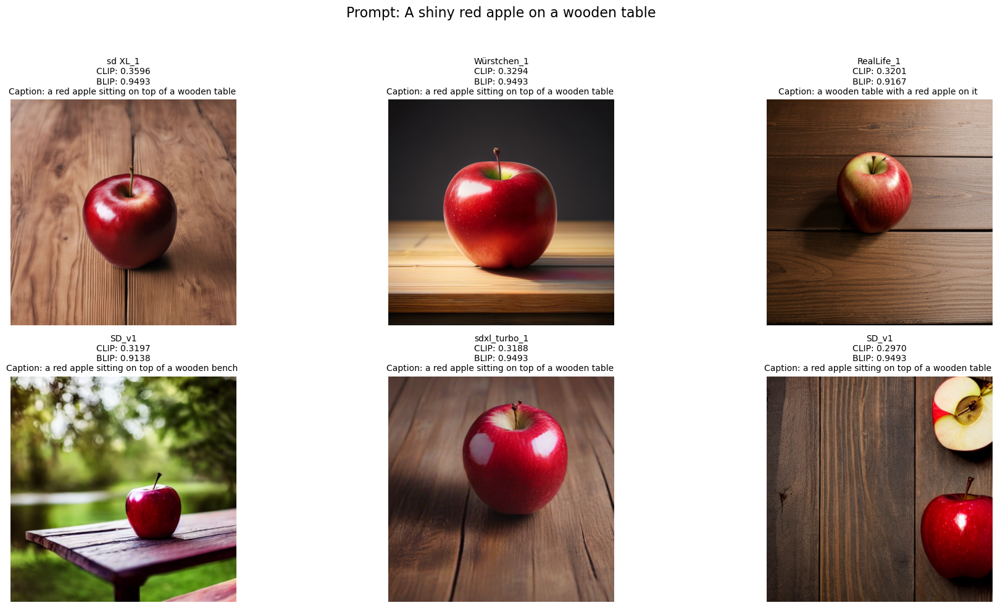

Processing folder: 101
Loaded prompt: A Native American headdress


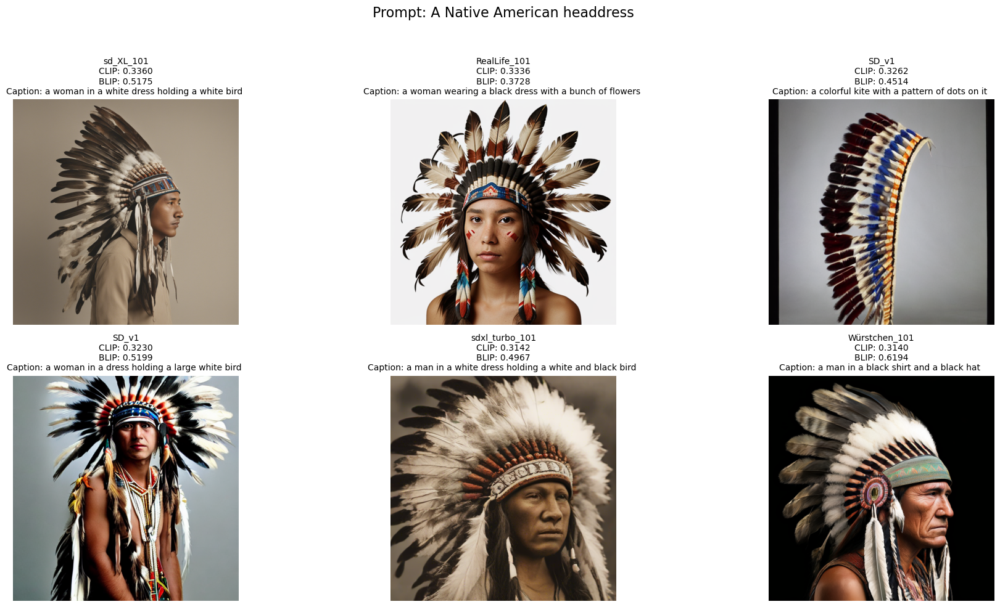

Processing folder: 102
Loaded prompt: A Masai warrior standing in a field


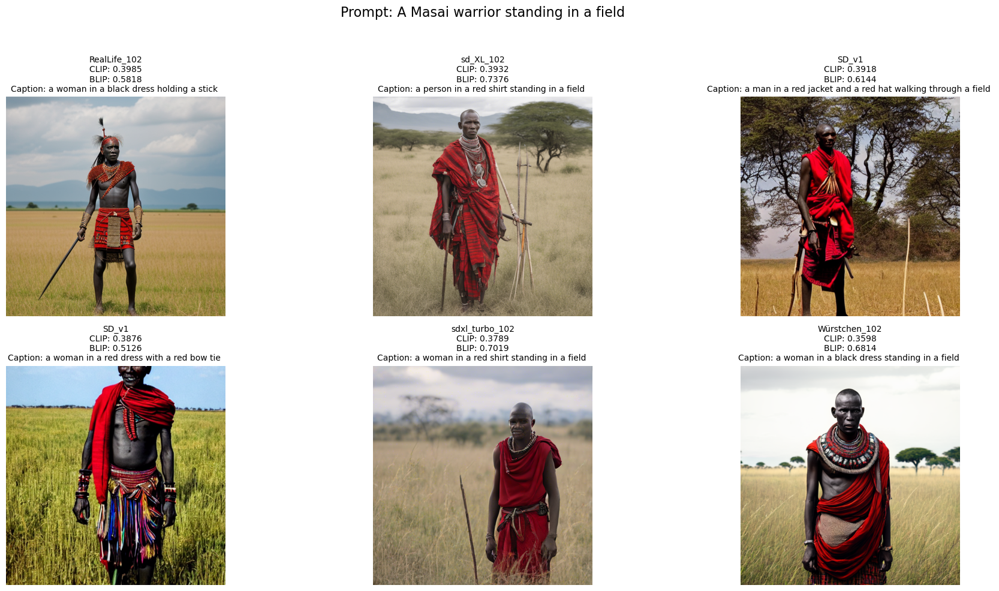

Processing folder: 103
Loaded prompt: A knight in armor during a medieval battle


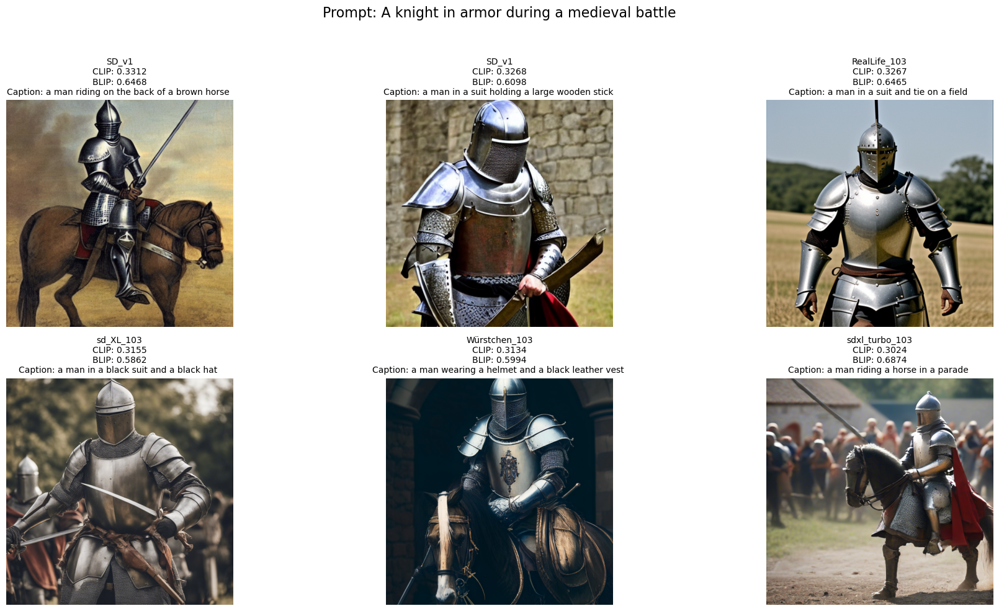

Processing folder: 104
Loaded prompt: A Roman legion marching through ancient Rome


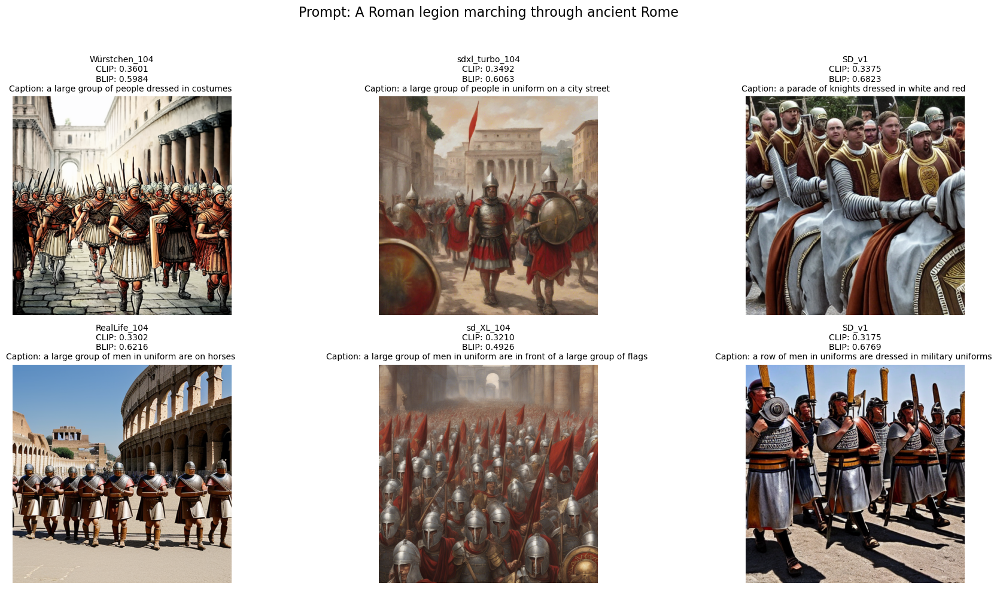

Processing folder: 105
Loaded prompt: A Pharaoh giving orders in ancient Egypt


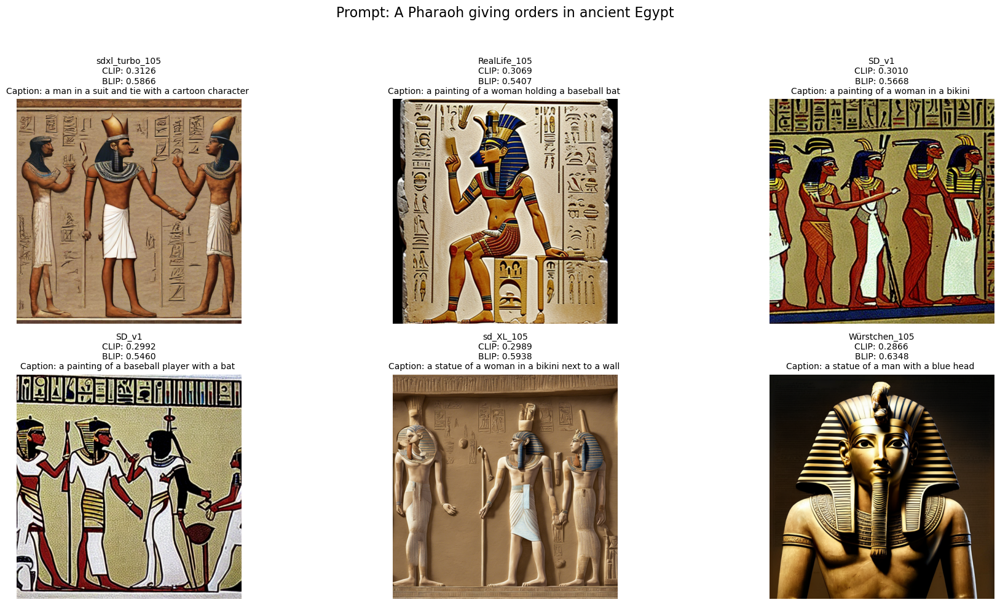

Processing folder: 106
Loaded prompt: A colorful Indian Holi festival


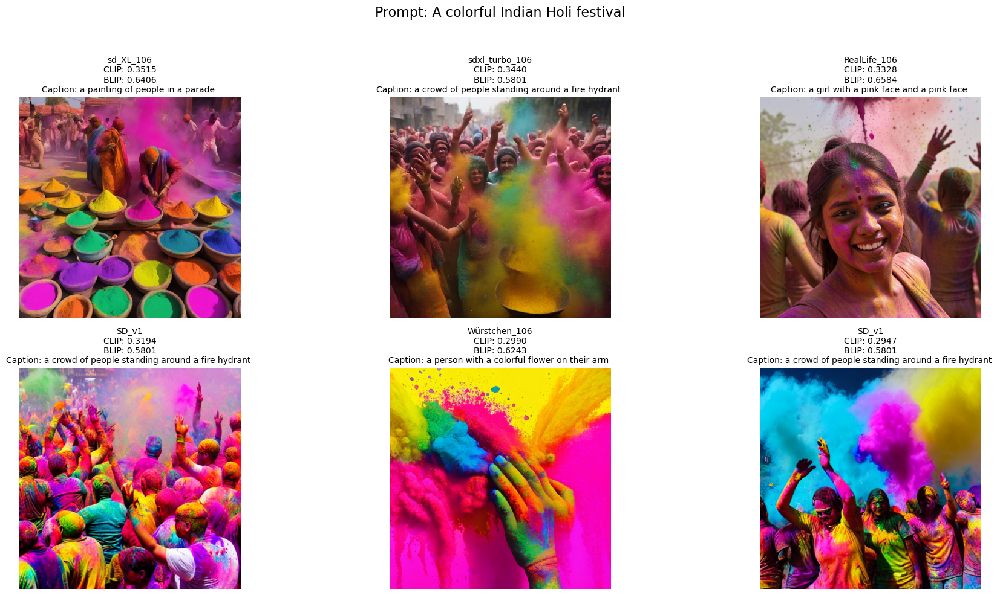

Processing folder: 107
Loaded prompt: A Chinese dragon dance during New Year


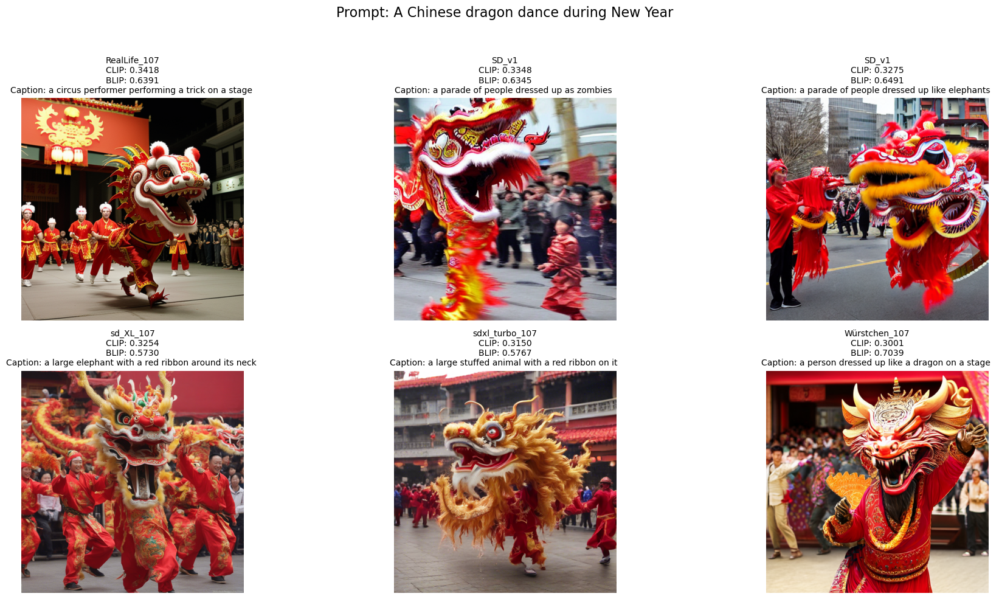

Processing folder: 108
Loaded prompt: A carnival parade in Rio de Janeiro


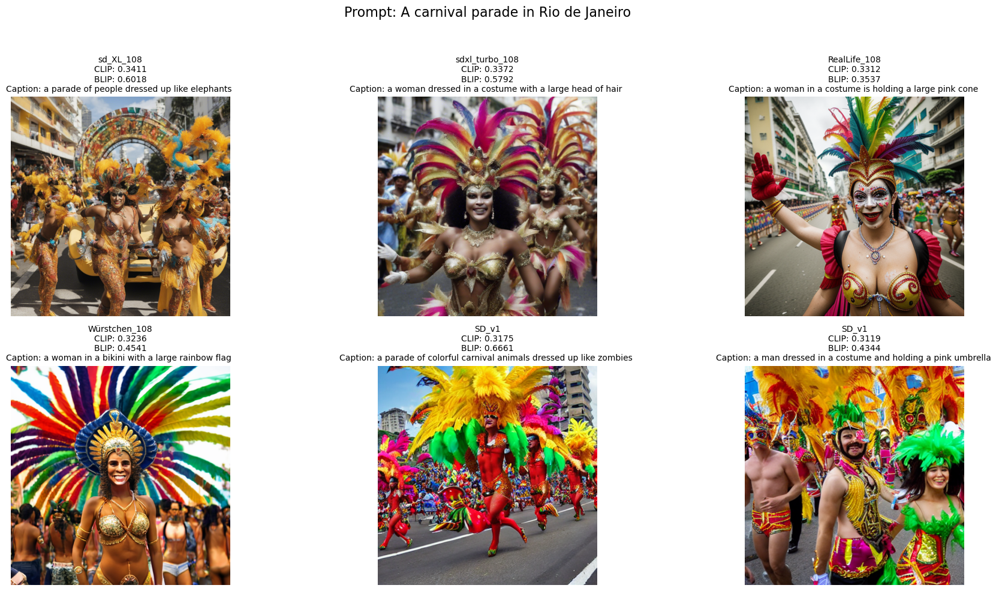

Completed displaying all images, prompts, and scores.


In [27]:
# Main loop to process all folders
# for folder_name in sorted(os.listdir(output_folder)):
for folder_name in sorted(os.listdir(output_folder))[:10]:# Process first 10 folders 
    folder_path = os.path.join(output_folder, folder_name)
    
    if os.path.isdir(folder_path):
        print(f"Processing folder: {folder_name}")

        # Process images in the folder
        results, prompt = process_images_in_folder(folder_path)

        # Visualize the results
        visualize_results(results, prompt)

print("Completed displaying all images, prompts, and scores.")

# Results from BRDG AGENCY FOR EVALUATING ABOVE IMAGES ARE INCLUDED AS A PDF FILE